<a id="TOP"> </a>
<div class="alert alert-box alert-info">
</div>

***

# FINAL REPORT

## by David Howell and Larry Holmes

# Clustering Project Summary

## Project Goals

> - Document code, process (data acquistion, preparation, exploratory data analysis and statistical testing, modeling, and model evaluation), findings, and key takeaways.
> - Create modules that make our process repeateable and our report (notebook) easier to read and follow.
> - Ask exploratory questions of the data that will help us understand more about the attributes and drivers of error in the Zestimates. 
> - Make recommendations to a data science team about how to improve predictions.
> - Refine our work into a report, in the form of a jupyter notebook, that I will walk through in a 5 minute presentation to our data science team about our goals, the work we did, what we found, our methodologies, and our conclusions.
> - Be prepared to answer panel questions about my code, process, findings and key takeaways, and model.

## Project Description

### Business Goals

> - Utilize clustering to create new features for exploration and model prediction
> - Find the key drivers of error in the Zestimates.
> - Deliver a report that the data science team can read through and replicate, understand what steps were taken, why and what the outcome was.
> - Make recommendations on what works or doesn't work in predicting error in the Zestimates.

### Deliverables

> - **Readme (.md)**
> - **A Python Module or Modules that automate the data acquisition and preparation process**
> - **Final Report (.ipynb)**
> - 5 min Recorded Presentation

## Data Dictionary

|**Target**|**Definition**
|:-------|:----------|
|**logerror**|**The total tax assessed value of the property**|

|**Feature**|**Definition**|
|:-------|:----------|
|**bedrooms**                 |**Number of bedrooms in home**|
|**bathrooms**              |**Number of bathrooms in home including fractional bathrooms**|
|**lat**                     |**Latitude of the middle of the parcel multiplied by 10e6**|
|**lon**                     |**Longitude of the middle of the parcel multiplied by 10e6**|
|**house_age**                |**How old the property is in years**| 
|**taxrate**                  |**The total property tax assessed for that assessment year divided by the total tax assessed value of the home**|
|**fips**                     |**Federal Information Processing Standard code**|
|**acres**                    |**Acreage of the home**|
|**tot_sqft**                 |**Calculated total finished living area of the home**|
|**land_dollar_per_sqft**     |**The assessed value of the land area of the home divided by the lot size in sqft**|
|**structure_dollar_per_sqft**|**The assessed value of the built structure on the house divided by the tot_sqft**|

## Initial Hypotheses
> We believe that by utilizing clustering methodology we will be able to discover new things about our dataset in order to discover affects and drives Logerror.  We believe that the clusters we create will add new dimensions to our future models thus increasing its accuracy. 

## Executive Summary - Key Findings and Recommendations
> 1. Utilizing three different cluster groups (area_cluster, size_cluster, price cluster) we were not able to increase the accuracy of our models in any meaningful way.

> 2. Many of the newly created features via feature engineering and clustering did nothing to add any value to the zillow dataset in terms of model creation, but it did help us futher our exploration and ask new questions we didn't know to ask beforehand. 

> 3. Our recommendations are that we maybe delve deeper into new clusters if given more time possibly brining in other features such as airconditioningtype and maybe looking into more time sensitive data such as transaction dates, etc.

[_Acquire_](#acquire)

<a id="acquire"> </a>
<div class="alert alert-box alert-info">
</div>

***
### Acquire Phase

> - Utilized wrangle.py to pull zillow data from a Codeup database.

In [1]:
import pandas as pd
import numpy as np
from IPython.display import display, Markdown, Latex

import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px

from modeling import get_centroids, create_clusters, assign_clusters
import evaluate
from wrangle import clean_zillow, summarize, split_data_continuous, prepare, explore_sets, get_big_X
from viz import get_viz
from viz import boxplots, hists, heatmaps, slicer, haversine

import scipy.stats as stats

from sklearn.metrics import mean_squared_error, explained_variance_score
from sklearn.linear_model import LinearRegression, LassoLars, TweedieRegressor
from sklearn.preprocessing import PolynomialFeatures
from sklearn.preprocessing import MinMaxScaler, RobustScaler
from sklearn.cluster import KMeans

from scipy.stats import pearsonr, spearmanr
from formating import bold, underline, strike 

import warnings
warnings.filterwarnings("ignore")

In [2]:
df = clean_zillow()

<a id="prepare"> </a>
<div class="alert alert-box alert-info">
</div>

***
### Prepare Phase

> - Utilized wranlge.py to clean up zillow dataset.
> - Split the overall dataset into my train, validate, and test datasets to be used later.
> - Utilized modeling.py to scale the datasets in order to properly cluster the dataset for exploration.

In [3]:
df = prepare(df)

<a id="explore"> </a>
<div class="alert alert-box alert-info">
</div>

***
### Explore Phase

> - Asked questions of the data and utilized visualizations and hypothesis testing to answer said questions.
> - Used clustering to further our exploration and created visualizations that enabled us to see the data in a new perspective.

In [4]:
X, train, validate, test, partitions = get_big_X()

In [49]:
#X[0]

In [50]:
# train

# Is there a relationship between tax rate and logerror...?

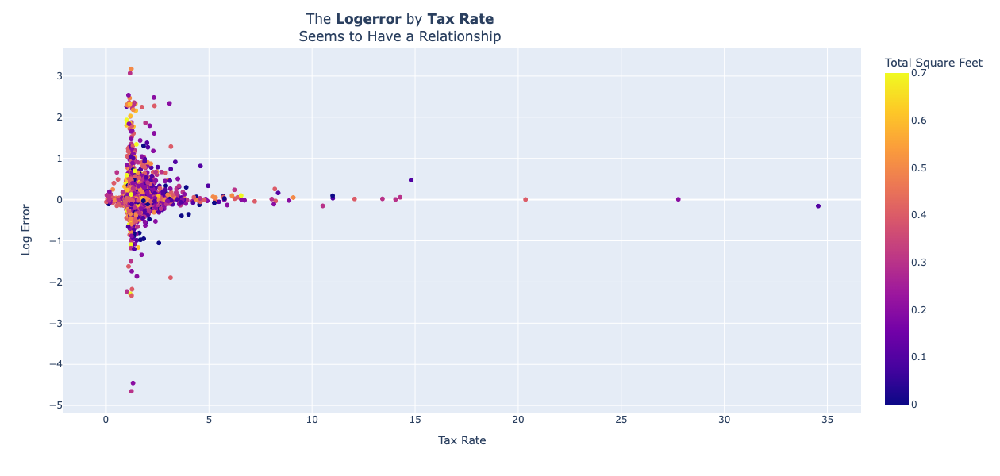

In [7]:
fig = px.scatter(data_frame=train,
                x= train.taxrate,
                y= 'logerror',
           color='tot_sqft_bin',
           # facet_col= train.hot_tub,
           category_orders={'fips':['Los Angeles County', 'Orange County', 'Ventura County']},
           color_discrete_sequence=['red', 'blue', 'green'],
           labels= {'logerror': 'Log Error', 'taxrate': 'Tax Rate', 'fips': 'County', 'tot_sqft_bin':'Total Square Feet'},
           height=600
               )
fig.update_layout(title= {'text': 'The <b>Logerror</b> by <b>Tax Rate</b><br>\
Seems to Have a Relationship',
                 'x': .4,
                 'y': .95,
                 'xanchor': 'center',
                 'yanchor': 'top'})


# It looks like the higher the Tax Rate, the less the logerror
- We will test this

In [8]:
r, p_value = pearsonr(x= train.taxrate, y= train.logerror)

In [9]:
α = .05

In [51]:
if p_value < α:
    print(f'We can REJECT the Null Hₒ: {strike("There is no correlation between Tax Rate and Logerror")}\n\
    With Correlation coeffiecent of {round(r,2)} and p_value of {round(p_value,3)}')
    
else:
    print(f'We CANNOT reject thr Null Hₒ: {bold("There is no linear correlation between Tax Rate and Logerror")}')

We CANNOT reject thr Null Hₒ: There is no linear correlation between Tax Rate and Logerror


## Would Creating Clusters Help Define Unique Groupings?

In [11]:
# list of variables I will cluster on. 
cluster_vars = ['scaled_lat', 'scaled_lon', 'house_age_bin']
cluster_name = 'area_cluster'
k_range = range(2,20)


In [12]:
from modeling import find_k

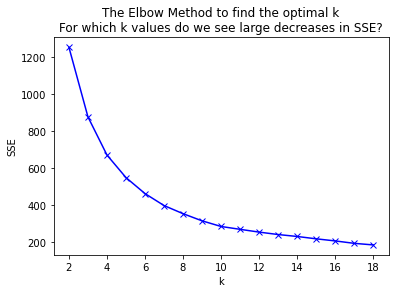

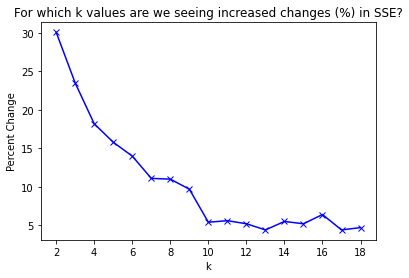

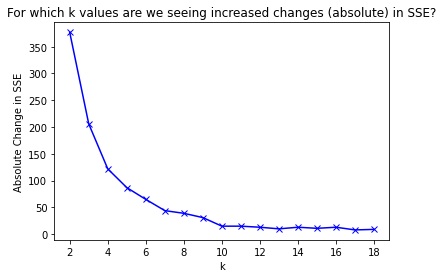

In [13]:
k_comparisons_df = find_k(X[0], cluster_vars, k_range)

## Area Cluster

In [14]:
k = 5
# as reminders: 
cluster_vars = ['scaled_lat', 'scaled_lon', 'house_age_bin']
cluster_name = 'area_cluster'

In [15]:
kmeans = create_clusters(X[0], k, cluster_vars)

In [16]:
centroid_df = get_centroids(kmeans, cluster_vars, cluster_name)

In [17]:
X = assign_clusters(X, kmeans, cluster_vars, cluster_name, centroid_df)

## Size Cluster

In [18]:
k=6
cluster_name = 'size_cluster'
cluster_vars = ['scaled_bathrooms', 'tot_sqft_bin', 'acres_bin', 'bed_bath_ratio']

# fit kmeans 
kmeans = create_clusters(X[0], k, cluster_vars)

# get centroid values per variable per cluster
centroid_df = get_centroids(kmeans, cluster_vars, cluster_name)

# get cluster assignments and append those with centroids for each X partition (train, validate, test)
X = assign_clusters(X, kmeans, cluster_vars, cluster_name, centroid_df)

# Price Cluster

In [19]:
k=6
cluster_name = 'price_cluster'
cluster_vars = ['scaled_taxrate', 'structure_dollar_sqft_bin', 'land_dollar_sqft_bin']

# fit kmeans 
kmeans = create_clusters(X[0], k, cluster_vars)

# get centroid values per variable per cluster
centroid_df = get_centroids(kmeans, cluster_vars, cluster_name)

# get cluster assignments and append those with centroids for each X partition (train, validate, test)
X = assign_clusters(X, kmeans, cluster_vars, cluster_name, centroid_df)

In [23]:
# update datatypes of binned values to be float
X[0] = X[0].astype({'size_cluster': 'category', 'area_cluster': 'category', 'price_cluster': 'category'})

In [20]:
y_train = partitions[-3]

## Does Size Cluster help define unique groups in Logerror Distribution?

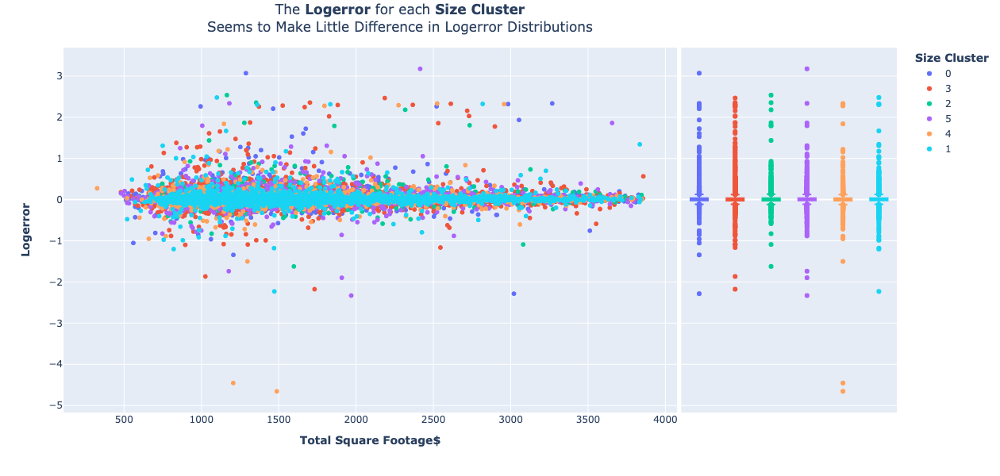

In [31]:
fig_size_cluster = px.scatter(data_frame=X[0],
           x= 'tot_sqft',
           y= y_train.logerror,
           # log_y= True,
           color= 'size_cluster',
          marginal_y='box',
          # size=y_train.OLS.abs(),
          labels= {'tot_sqft': '<b>Total Square Footage$</b>'
                    ,'y': '<b>Logerror</b>', 'size_cluster':'<b>Size Cluster</b>'},
          height= 600,
          width= 1200)
fig_size_cluster.update_layout(title= {'text': 'The <b>Logerror</b> for each <b>Size Cluster</b><br>\
Seems to Make Little Difference in Logerror Distributions',
                 'x': .4,
                 'y': .97,
                 'xanchor': 'center',
                 'yanchor': 'top'})

## How about Area Cluster with Logerror?

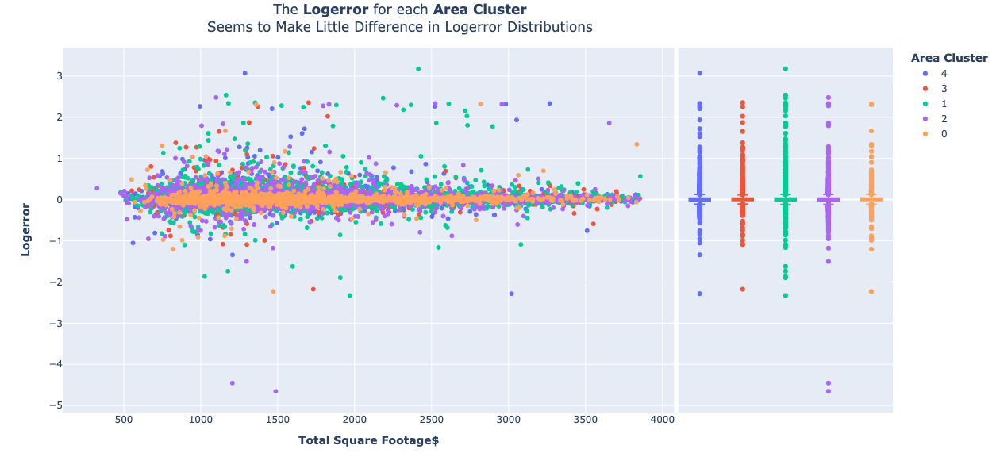

In [30]:
fig_area_cluster = px.scatter(data_frame=X[0],
           x= 'tot_sqft',
           y= y_train.logerror,
           # log_y= True,
           color= 'area_cluster',
          marginal_y='box',
          # size=y_train.OLS.abs(),
          labels= {'tot_sqft': '<b>Total Square Footage$</b>'
                    ,'y': '<b>Logerror</b>', 'area_cluster':'<b>Area Cluster</b>'},
          height= 600,
          width= 1200)
fig_area_cluster.update_layout(title= {'text': 'The <b>Logerror</b> for each <b>Area Cluster</b><br>\
Seems to Make Little Difference in Logerror Distributions',
                 'x': .4,
                 'y': .97,
                 'xanchor': 'center',
                 'yanchor': 'top'})

## Does Price Cluster create unique groups within Logerror Distribution?

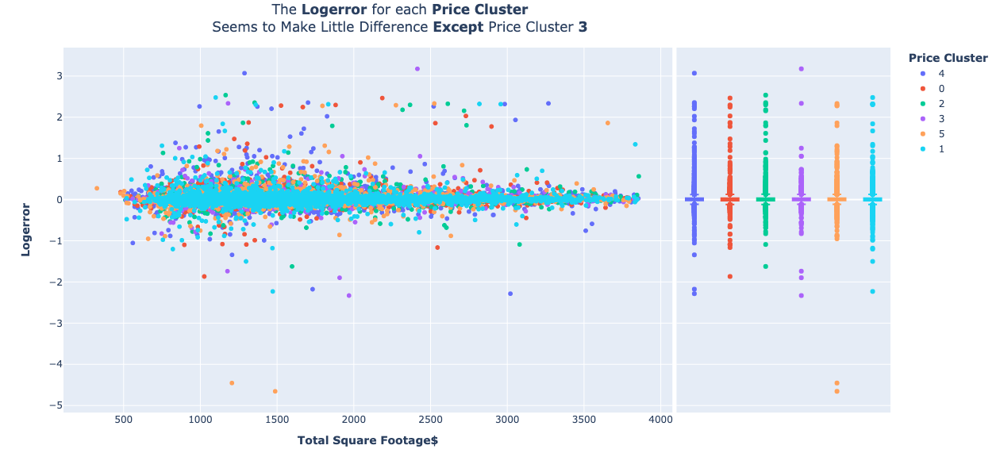

In [24]:
fig_price_cluster = px.scatter(data_frame=X[0],
           x= 'tot_sqft',
           y= y_train.logerror,
           # log_y= True,
           color= 'price_cluster',
                # facet_col_wrap=2,
                               # color_discrete_sequence=[0,1,2,3,4,5],
          marginal_y='box',
          # size=y_train.OLS.abs(),
            labels= {'tot_sqft': '<b>Total Square Footage$</b>'
                    ,'y': '<b>Logerror</b>', 'price_cluster':'<b>Price Cluster</b>'},
          height= 600,
          width= 1200)
fig_price_cluster.update_layout(title= {'text': 'The <b>Logerror</b> for each <b>Price Cluster</b><br>\
Seems to Make Little Difference <b>Except</b> Price Cluster <b>3</b>',
                 'x': .4,
                 'y': .97,
                 'xanchor': 'center',
                 'yanchor': 'top'})

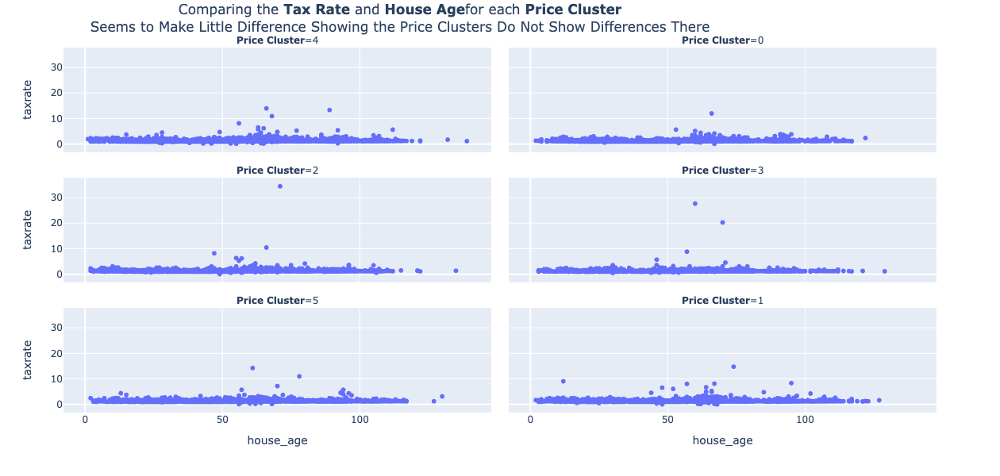

In [26]:
fig_price_cluster = px.scatter(data_frame=X[0],
           x= 'house_age',
           # y= y_train.logerror,
            y= 'taxrate',
           # log_y= True,
           facet_col= 'price_cluster',
                facet_col_wrap=2,
                               # color_discrete_sequence=[0,1,2,3,4,5],
          marginal_y='box',
          # size=y_train.OLS.abs(),
            labels= {'tot_sqft': '<b>Total Square Footage$</b>'
                    ,'y': '<b>Logerror</b>', 'price_cluster':'<b>Price Cluster</b>'},
          height= 600,
          width= 1200)
fig_price_cluster.update_layout(title= {'text': 'Comparing the <b>Tax Rate</b> and <b>House Age</b> for each <b>Price Cluster</b><br>\
Seems to Make Little Difference Showing the Price Clusters Do Not Show Differences There',
                 'x': .4,
                 'y': .97,
                 'xanchor': 'center',
                 'yanchor': 'top'})

<a id="model"> </a>
<div class="alert alert-box alert-info">
</div>

***
### Model Phase

> - Set up the baseline prediction for future models to base their success on.
> - Trained multiple models for each type of Regression technique (Ordinary Least Squares, LASSO + LARS, and Polynomial Regression Model)
> - Validated all models to narrow down my selection to the best performing model.
> - Chose the MVP of all created models and used the test data set to ensure the best model worke entirely to expectations.

In [32]:
feat_train = X[0].drop(columns=['centroid_scaled_lat','centroid_scaled_lon','centroid_house_age_bin','centroid_scaled_bathrooms','centroid_tot_sqft_bin',
                              'centroid_acres_bin', 'centroid_bed_bath_ratio', 'centroid_scaled_taxrate', 'centroid_structure_dollar_sqft_bin',
                              'centroid_land_dollar_sqft_bin', 'Los Angeles County', 'Orange County', 'Ventura County', 'bathrooms', 'taxrate', 'lat', 'lon'])
feat_val = X[1].drop(columns=['centroid_scaled_lat','centroid_scaled_lon','centroid_house_age_bin','centroid_scaled_bathrooms','centroid_tot_sqft_bin',
                              'centroid_acres_bin', 'centroid_bed_bath_ratio', 'centroid_scaled_taxrate', 'centroid_structure_dollar_sqft_bin',
                              'centroid_land_dollar_sqft_bin', 'Los Angeles County', 'Orange County', 'Ventura County', 'bathrooms', 'taxrate', 'lat', 'lon'])                             

In [34]:
y_validate = partitions[-2]

In [35]:
# Eliminate columns that weren't selected to be used in modeling
X_train_alt = feat_train.drop(columns=['tot_sqft', 'house_age', 'acres', 'acres_bin',
       'tot_sqft_bin', 'bed_bath_ratio', 'incity_la', 'scaled_lon',
       'scaled_bathrooms'])
X_validate_alt = feat_val.drop(columns=['tot_sqft', 'house_age', 'acres', 'acres_bin',
       'tot_sqft_bin', 'bed_bath_ratio', 'incity_la', 'scaled_lon',
       'scaled_bathrooms'])

# Create a dataframe for target variable
y_train = pd.DataFrame(y_train)
y_validate = pd.DataFrame(y_validate)

# Establish baseline predictions
baseline = y_train['logerror'].mean()
y_train['baseline'] = baseline
y_validate['baseline'] = baseline

# Calculate RMSE for train and validate dataset
rmse_train = mean_squared_error(y_train.logerror, y_train.baseline) ** .5
rmse_validate = mean_squared_error(y_validate.logerror, y_validate.baseline) ** .5

print('RMSE using Mean\nTrain/In-Sample: ', round(rmse_train,2),
      '\nValidate/Out-of-Sample: ', round(rmse_validate, 2))

# Create a dataframe that tracks the metrics that we will use to compare each model
metric_df = pd.DataFrame(
    data=[{
        'model': 'mean_baseline',
        'rmse': rmse_validate,
        'r^2': explained_variance_score(y_validate.logerror, y_validate.baseline)
    }])

RMSE using Mean
Train/In-Sample:  0.17 
Validate/Out-of-Sample:  0.16


In [36]:
# creating an Ordinary Least Squares model
metric_df = evaluate.model_metrics(LinearRegression(), X_train_alt, y_train, X_validate_alt, y_validate, metric_df)

Name for model? OLS


In [37]:
# creating a Lasso + Lars model
metric_df = evaluate.model_metrics(LassoLars(alpha=1), X_train_alt, y_train, X_validate_alt, y_validate, metric_df)

Name for model? Lasso Lars


In [38]:
# creating a Generalized Linear Model
# metric_df = evaluate.model_metrics(TweedieRegressor(power = , alpha = 1), X_train_alt, y_train, X_validate_alt, y_validate, metric_df)

In [39]:
# making the method
pf = PolynomialFeatures(degree = 2)

# fitting the method and transforming the features into polynomial features
X_train_d2 = pf.fit_transform(X_train_alt)

X_validate_d2 = pf.transform(X_validate_alt)

# making the model
lm2 = LinearRegression(normalize=True)

# fitting the model to the transformed features
lm2.fit(X_train_d2, y_train.logerror)

# making predictions
in_sample_pred = lm2.predict(X_train_d2)
out_sample_pred = lm2.predict(X_validate_d2)
model_name = input('Name for model?')
y_train[model_name] = in_sample_pred
y_validate[model_name] = out_sample_pred

# evaluating error
rmse_val = mean_squared_error(y_validate['logerror'], out_sample_pred, squared=False)
r_squared_val = explained_variance_score(y_validate['logerror'], out_sample_pred)

# appending metrics to metrics table
metric_df = metric_df.append({
        'model': model_name,
        'rmse': rmse_val,
        'r^2': r_squared_val
    }, ignore_index=True)

Name for model? Poly


In [40]:
metric_df

,model,rmse,r^2
0,mean_baseline,0.157262,0.000000e+00
1,OLS,0.157170,1.180814e-03
2,Lasso Lars,0.157262,-2.220446e-16
3,Poly,0.157943,-7.849568e-03


In [43]:
y_test = partitions[-1]

In [44]:
X_test_alt = X[2].drop(columns=[])
y_test = pd.DataFrame(y_test)
y_test['baseline'] = baseline
rmse_test = mean_squared_error(y_test.logerror, y_test.baseline) ** .5

test_metric_df = pd.DataFrame(
    data=[{
        'model': 'mean_baseline',
        'rmse': rmse_test,
        'r^2': explained_variance_score(y_test.logerror, y_test.baseline)
    }])

test_metric_df

,model,rmse,r^2
0,mean_baseline,0.158204,0.0


In [ ]:
model = LinearRegression()
model.fit(X[0], y_train['logerror'])
in_sample_pred = model.predict(X[2])
model_name = input('Name for model?')
y_test[model_name] = in_sample_pred

 
rmse_val = mean_squared_error(y_test['logerror'], in_sample_pred, squared=False)
r_squared_val = explained_variance_score(y_test['logerror'], in_sample_pred)
test_metric_df = test_metric_df.append({
    'model': model_name,
    'rmse': rmse_val,
    'r^2': r_squared_val
    }, ignore_index=True)

Name for model? LinReg


In [ ]:
test_metric_df

,model,rmse,r^2
0,mean_baseline,0.158204,0.000000
1,LinReg,0.158480,-0.003489


# Conclusions and Recommendations

> - We discovered that clustering data within the Zillow dataset added very little value to predicting logerror

> - We recommend that the team find different features to cluster maybe looking into acquiring data that isn't within the Zillow dataset (major roads, major stores, etc)

> - Moving forward we would like to create features that have higher correlation with each other that will create more defined clusters to utilize.

<a id="conclusion"> </a>
<div class="alert alert-box alert-info">
</div>

***

# We looked at a map to see where the largest errors were...

![error on the streets](https://raw.githubusercontent.com/zillow-tri-county-clusters-2017/project/main/error_on_streets.png)

<div class="alert alert-box alert-info">
</div>

***

## How To Reproduce Our Project

> 1. Read our README.md.
> 2. Download the wrangle.py, formating.py, evaluate.py, modeling.py, and final_report.ipynb files into your directory along with your own env file that contains your user, password, and host variables,
> 3. Run our final_report.ipynb notebook